In [30]:
import transformers
import datasets
import shap
from shap.plots import *
import csv
import nltk
import re, string
import pandas as pd
import numpy as np
from nltk.tokenize import word_tokenize
from collections import Counter
%matplotlib inline
from plotly import graph_objs as go
import plotly.express as px
import plotly.figure_factory as ff
import datetime
import torch
import random
from PIL import Image
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\tomek\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [31]:
# convert date from string to datetime object
def convert_date(tweets):
    for i in range(len(tweets)):
        tweets['date'][i] = datetime.datetime.strptime(tweets['date'][i], '%Y-%m-%d %H:%M:%S')
    return tweets
        
# select n random tweets from start date to end date
def choose_tweets_from_date(tweets, start, end, n):
    start = datetime.datetime.strptime(start, '%Y-%m-%d')
    end = datetime.datetime.strptime(end, '%Y-%m-%d')
    choices = []
    for i in range(len(tweets)):
        if start <= tweets['date'][i] <= end:
            el = tweets['content'][i]
            choices.append(el)
        
    chosen=random.sample(choices, n)

    return chosen

def clean_text(text):
    text = str(text).lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    text = re.sub('\'','', text)
    
    return text

def load_and_preprocess_tweets():
    tweets = pd.read_csv('WFiIS-UM-main/datasets/realdonaldtrump.csv')
    tweets = tweets.drop(['link', 'retweets', 'favorites', 'mentions', 'hashtags'], axis=1)

    tweets['content'] = tweets['content'].map(lambda x: re.sub(r'@\w+\s', ' ', x))
    tweets['content'] = tweets['content'].map(lambda x: re.sub(r'https?://\S+|www\.\S+', '', x))
    tweets['content'] = tweets['content'].map(lambda x: re.sub(r'\W+', ' ', x))
    tweets['content'] = tweets['content'].replace(r'\W+', ' ', regex=True)
    tweets['content'] = tweets['content'].apply(lambda x: clean_text(x))
    tweets['token'] = tweets['content'].apply(lambda x: word_tokenize(x))
    tweets['text'] = tweets['token'].apply(lambda x: ' '.join([word for word in x if len(word)>2]))
    convert_date(tweets)

    return tweets

In [ ]:
tweets = load_and_preprocess_tweets()

FileNotFoundError: [Errno 2] No such file or directory: 'WFiIS-MIO-main/datasets/realdonaldtrump.csv'

In [ ]:
n = 20
before = choose_tweets_from_date(tweets, '2011-01-01', '2017-01-19', n)
after = choose_tweets_from_date(tweets, '2017-01-20', '2021-01-20', n)
before

['it is going to be a long and tough road to turn around cnn they are looking at the wrong people ',
 'entrepreneurs be tough be smart be personable but don t take things personally that s good business ',
 'we need a real president ',
 'no wonder afghanistan is a mess barackobama is releasing high level insurgents in exchange for pledges of peace ',
 ' homerealtyindia mr trump with lodha is developing the iconic trumptower in mumbai pic twitter com  ',
 ' realdonaldtrump any books you suggest for young entrepreneurs midas touch is excellent written for entrepreneurs ',
 ' true ',
 'all  of the world s top  players will be at trump national doral on thursday sunday for the cadillac world golf championship ',
 ' fallout from iowa trump speech drew greatest response via by jim meyerspic twitter com ',
 'to show you how dishonest some of the press is they took my funny cont ',
 ' danielstephan realdonaldtrump we need you in the white house donald somebody s gotta get this country back on 

In [ ]:
top = Counter([item for sublist in tweets['token'] for item in sublist])
temp = pd.DataFrame(top.most_common(20))
temp.columns = ['Common_words','count']
temp.style.background_gradient(cmap='Blues')

,Common_words,count
0,the,34657
1,to,19801
2,and,15928
3,a,15491
4,of,13345
5,is,12886
6,in,11942
7,i,10795
8,you,10716
9,for,9991


In [ ]:
fig = px.bar(temp, x="count", y="Common_words", title='Common Words in Selected Text', orientation='h', 
          width=700, height=700,color='Common_words')
fig.show()

In [ ]:
classifier = transformers.pipeline('sentiment-analysis', return_all_scores=True)
classifier(before)

pmodel = shap.models.TransformersPipeline(classifier, rescale_to_logits=True) 

explainer2 = shap.Explainer(pmodel)
shap_values = explainer2(before)

No model was supplied, defaulted to distilbert-base-uncased-finetuned-sst-2-english (https://huggingface.co/distilbert-base-uncased-finetuned-sst-2-english)


  0%|          | 0/248 [00:00<?, ?it/s]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  20%|███████████████████▍                                                                             | 4/20 [00:14<00:07,  2.26it/s]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  25%|████████████████████████▎                                                                        | 5/20 [00:22<00:49,  3.31s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  30%|█████████████████████████████                                                                    | 6/20 [00:29<01:07,  4.84s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  40%|██████████████████████████████████████▊                                                          | 8/20 [00:37<00:47,  3.95s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  45%|███████████████████████████████████████████▋                                                     | 9/20 [00:45<00:56,  5.10s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  50%|████████████████████████████████████████████████                                                | 10/20 [00:51<00:53,  5.40s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  55%|████████████████████████████████████████████████████▊                                           | 11/20 [00:58<00:52,  5.87s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  60%|█████████████████████████████████████████████████████████▌                                      | 12/20 [01:05<00:50,  6.33s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  65%|██████████████████████████████████████████████████████████████▍                                 | 13/20 [01:12<00:46,  6.63s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  75%|████████████████████████████████████████████████████████████████████████                        | 15/20 [01:22<00:27,  5.57s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  80%|████████████████████████████████████████████████████████████████████████████▊                   | 16/20 [01:31<00:25,  6.49s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  85%|█████████████████████████████████████████████████████████████████████████████████▌              | 17/20 [01:38<00:19,  6.59s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  90%|██████████████████████████████████████████████████████████████████████████████████████▍         | 18/20 [01:46<00:14,  7.01s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  95%|███████████████████████████████████████████████████████████████████████████████████████████▏    | 19/20 [01:53<00:07,  7.26s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 21it [02:07,  6.69s/it]                                                                                                              


In [ ]:
shap.plots.text(shap_values[:,:,1])

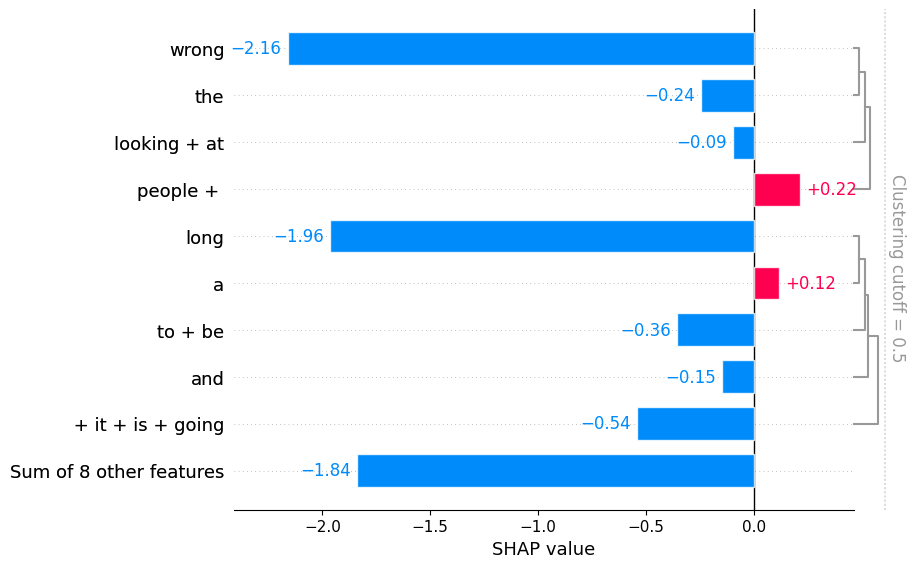

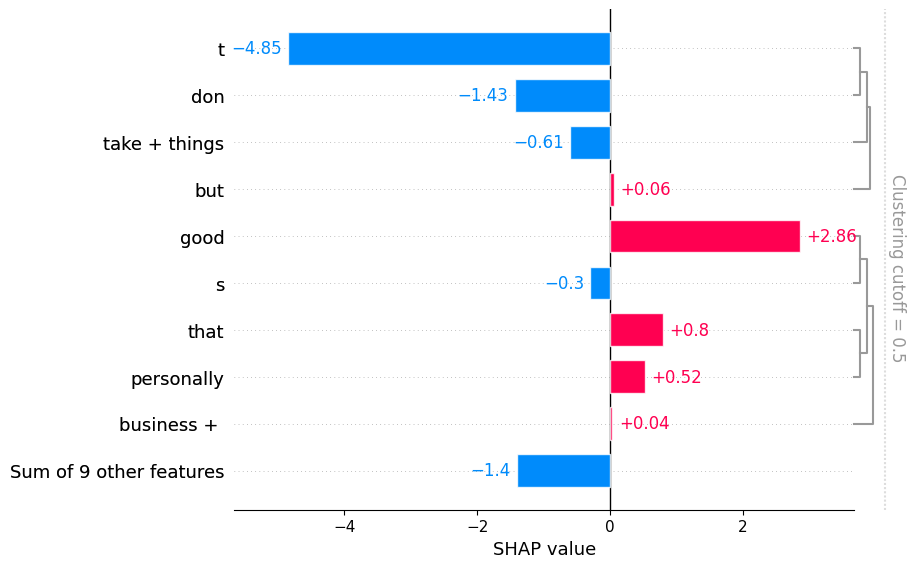

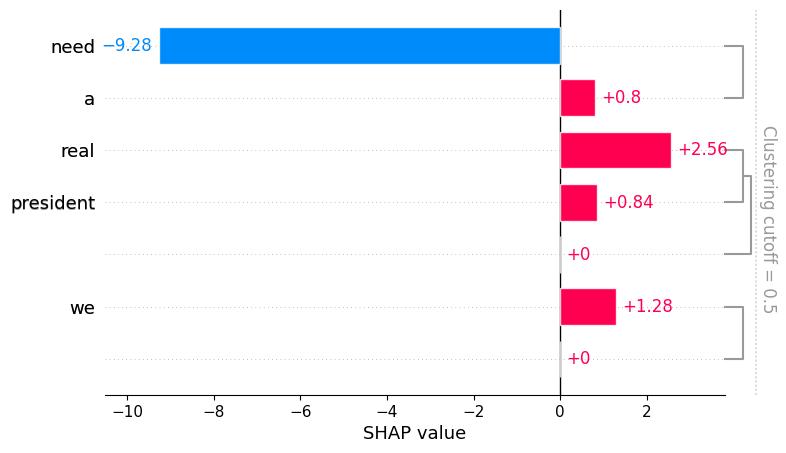

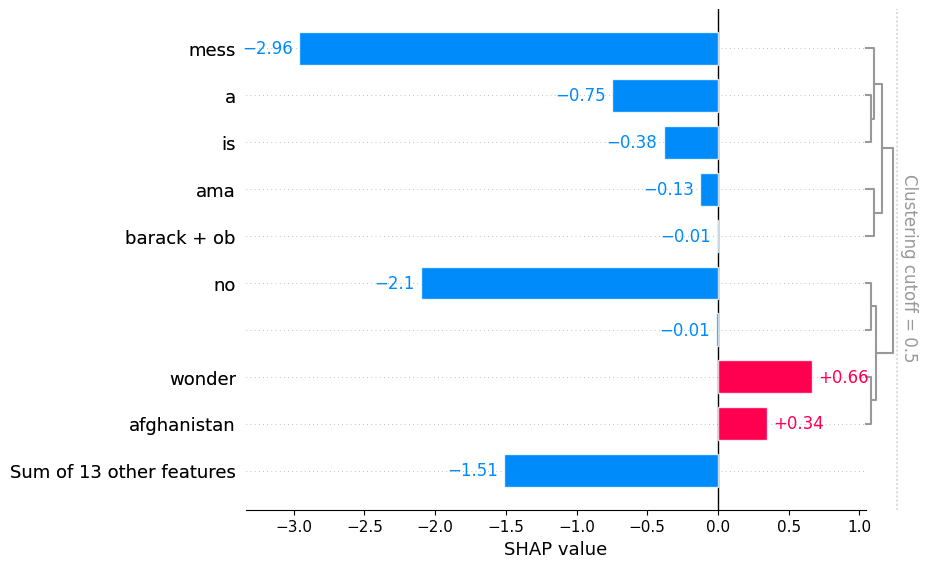

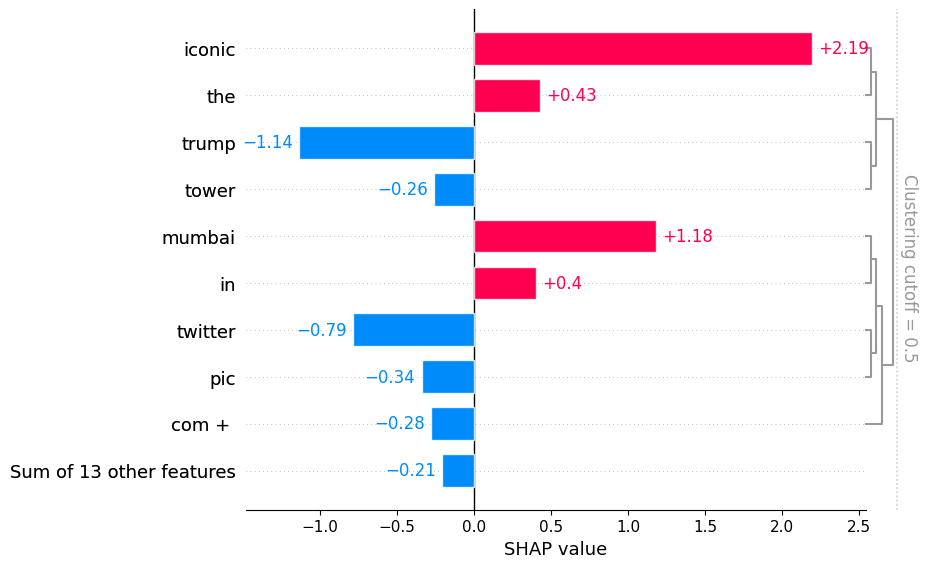

...

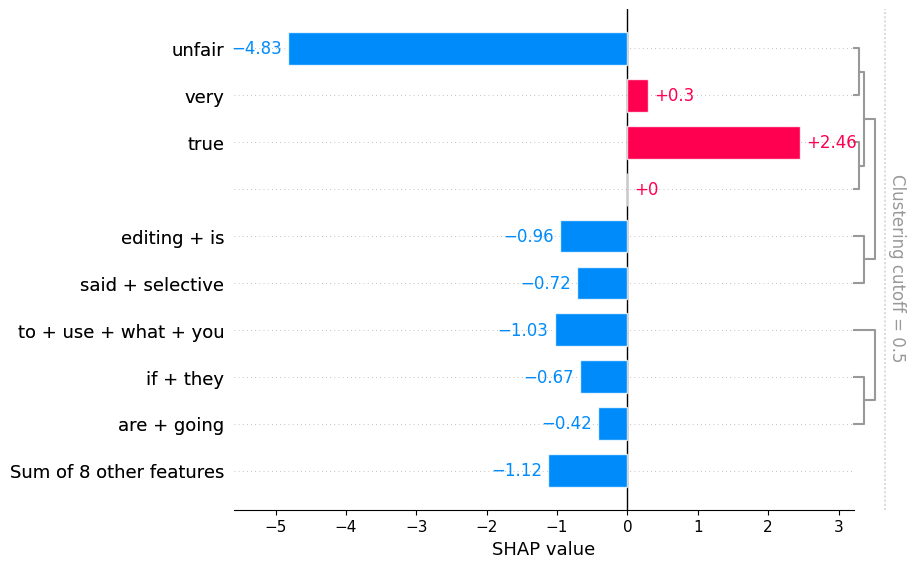

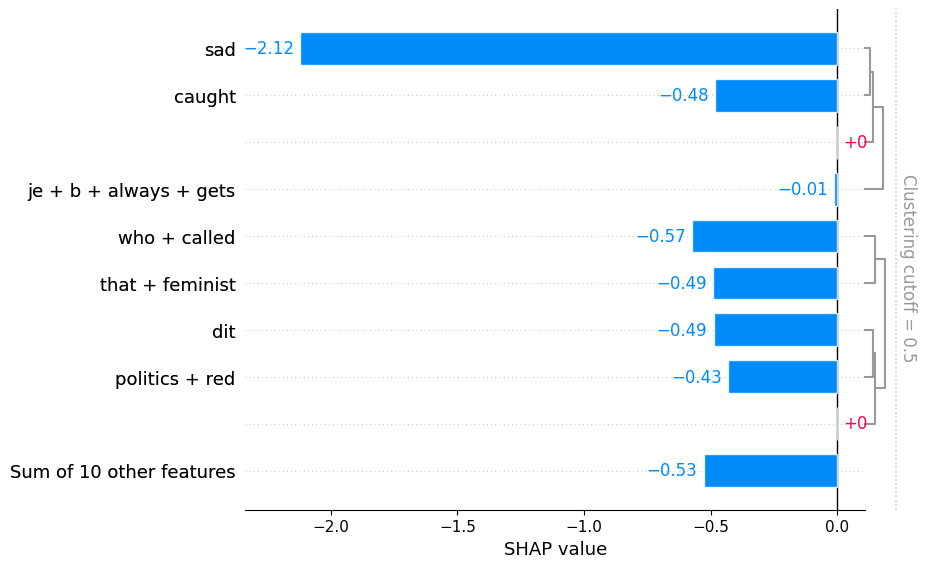

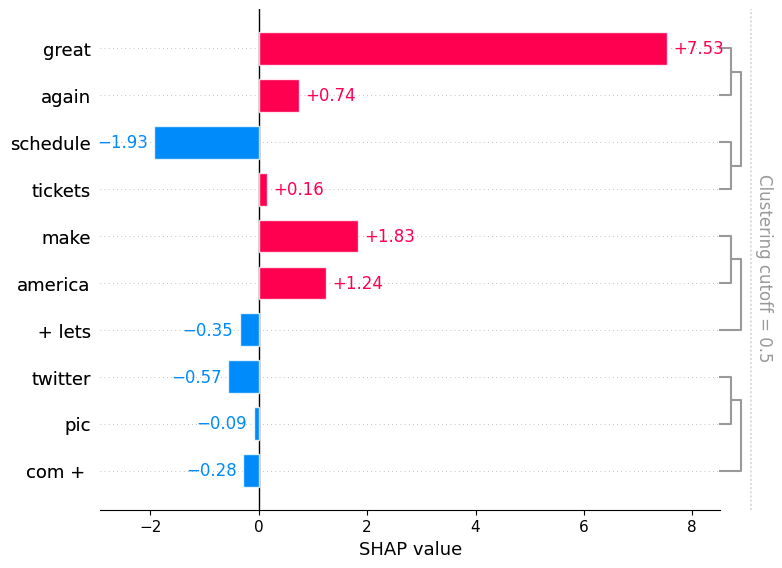

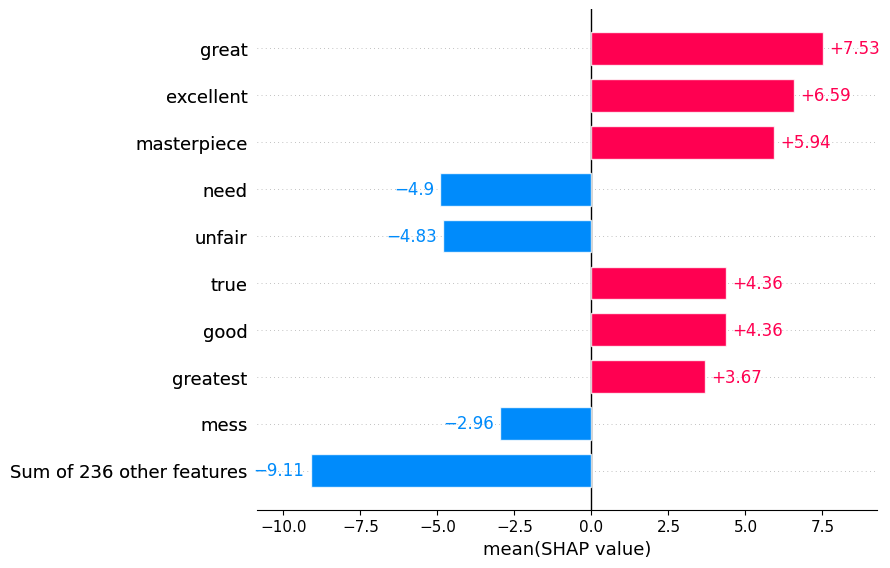

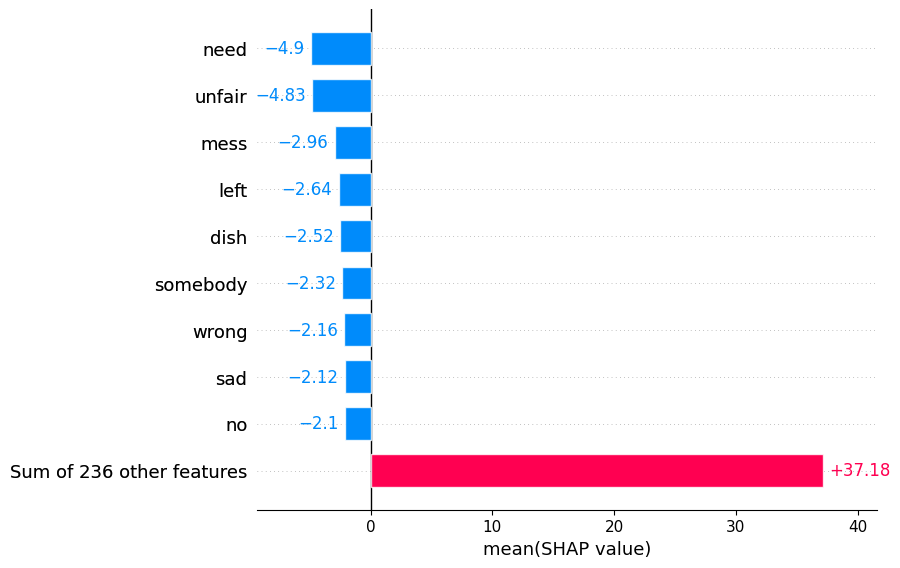

In [ ]:
for i in range(n):
    shap.plots.bar(shap_values[i, :,"POSITIVE"])
shap.plots.bar(shap_values[:, :, "POSITIVE"].mean(0))
shap.plots.bar(shap_values[:, :, "POSITIVE"].mean(0), order=shap.Explanation.argsort)

In [ ]:
average_before = sum(shap_values[:, :, "POSITIVE"].mean(0).values)/len(shap_values[:, :, "POSITIVE"].mean(0).values)
print(average_before)

0.0434214058045168


In [ ]:
classifier = transformers.pipeline('sentiment-analysis', return_all_scores=True)
classifier(after)

pmodel = shap.models.TransformersPipeline(classifier, rescale_to_logits=True)

explainer2 = shap.Explainer(pmodel)
shap_values = explainer2(after)

No model was supplied, defaulted to distilbert-base-uncased-finetuned-sst-2-english (https://huggingface.co/distilbert-base-uncased-finetuned-sst-2-english)


0.0434214058045168


  0%|          | 0/248 [00:00<?, ?it/s]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  15%|███████████████▊                                                                                         | 3/20 [00:00<?, ?it/s]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  25%|████████████████████████▎                                                                        | 5/20 [00:27<01:32,  6.17s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  30%|█████████████████████████████                                                                    | 6/20 [00:37<01:49,  7.81s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  50%|████████████████████████████████████████████████                                                | 10/20 [00:47<00:29,  2.91s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  55%|████████████████████████████████████████████████████▊                                           | 11/20 [00:57<00:46,  5.11s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  60%|█████████████████████████████████████████████████████████▌                                      | 12/20 [01:09<00:56,  7.10s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  65%|██████████████████████████████████████████████████████████████▍                                 | 13/20 [01:16<00:50,  7.26s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  75%|████████████████████████████████████████████████████████████████████████                        | 15/20 [01:25<00:27,  5.49s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  80%|████████████████████████████████████████████████████████████████████████████▊                   | 16/20 [01:32<00:24,  6.01s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  85%|█████████████████████████████████████████████████████████████████████████████████▌              | 17/20 [01:40<00:19,  6.35s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  90%|██████████████████████████████████████████████████████████████████████████████████████▍         | 18/20 [01:46<00:12,  6.46s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  95%|███████████████████████████████████████████████████████████████████████████████████████████▏    | 19/20 [01:58<00:07,  7.93s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 100%|████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [02:06<00:00,  7.91s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 21it [02:12,  7.33s/it]                                                                                                              


In [ ]:
shap.plots.text(shap_values[:,:,1])

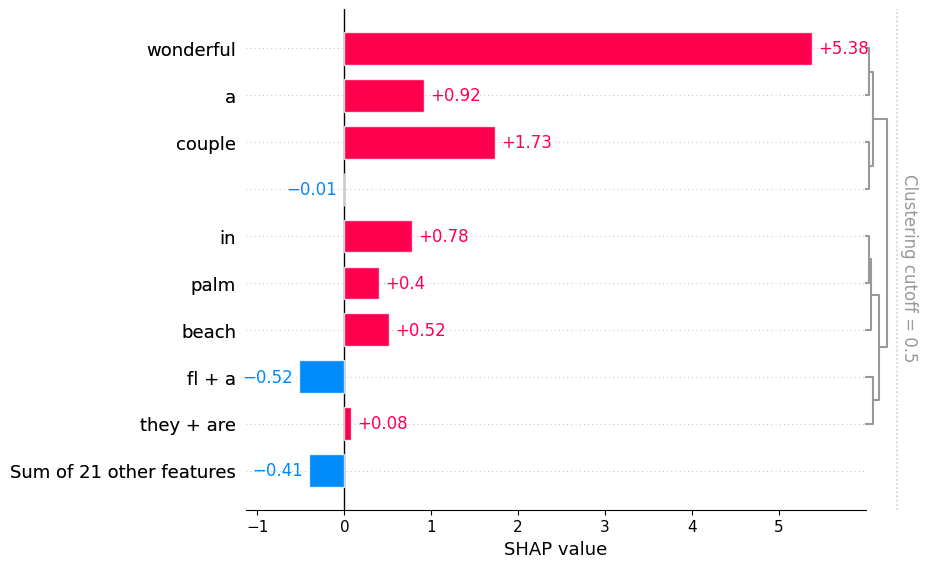

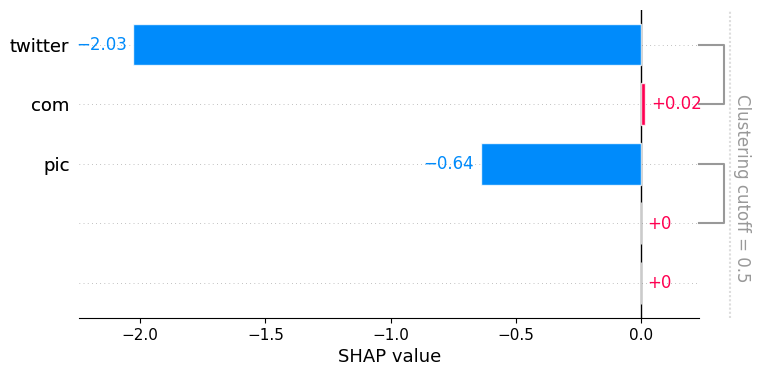

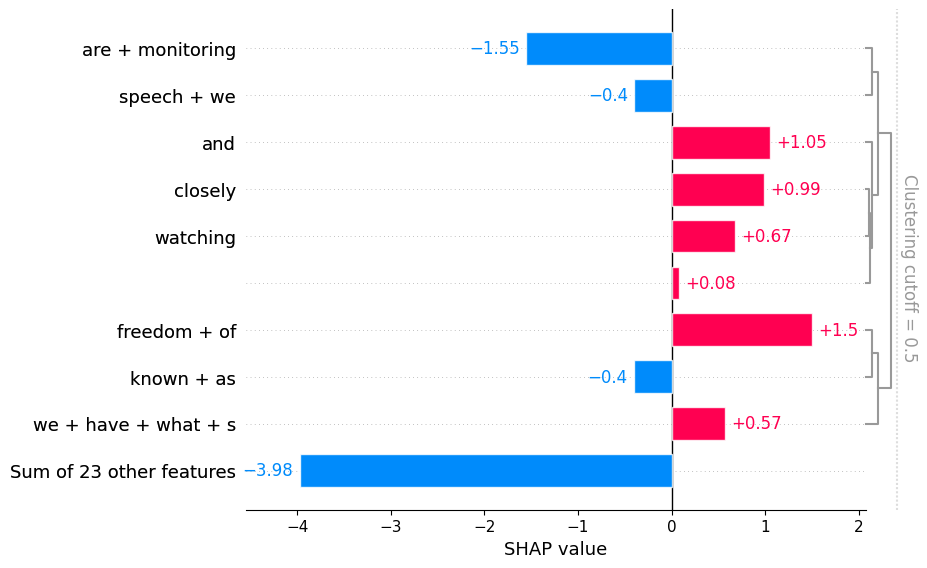

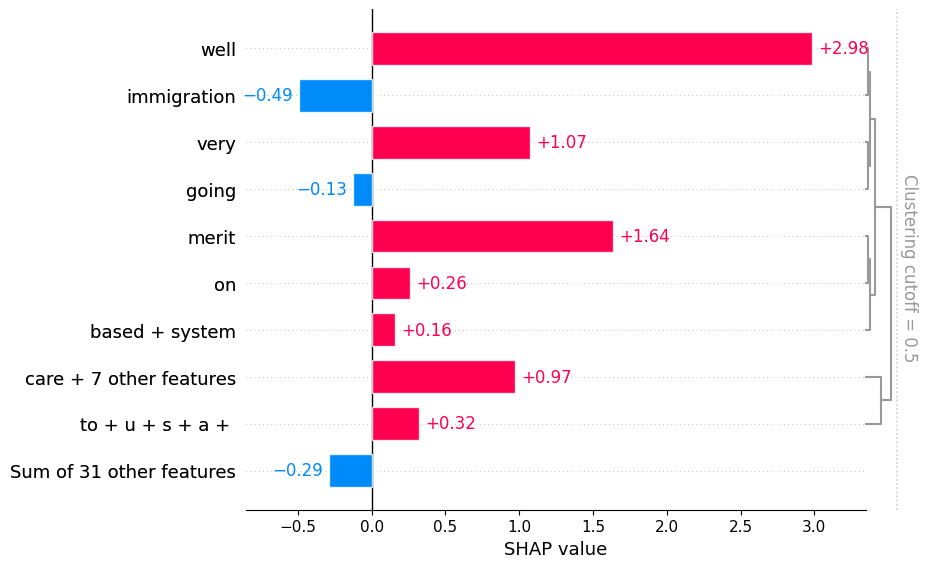

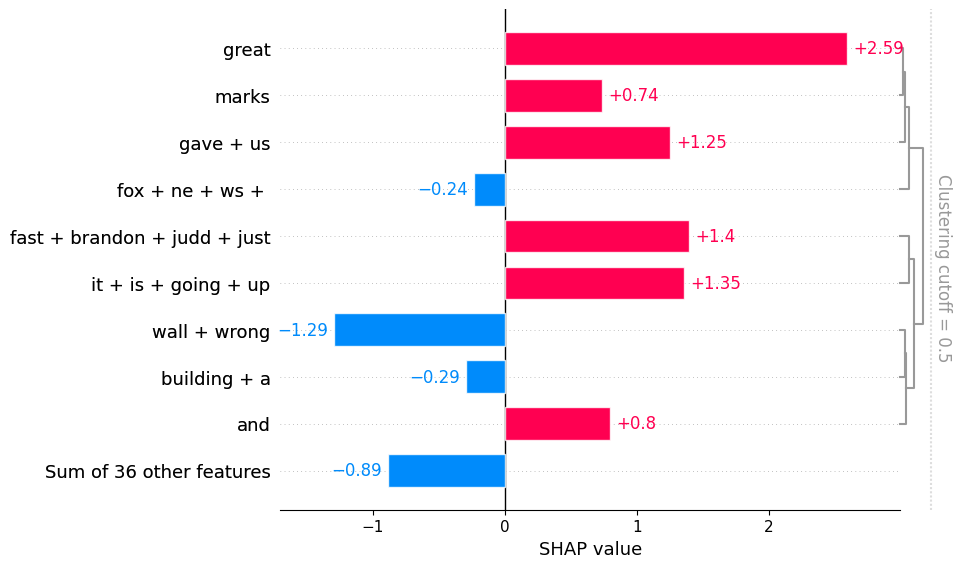

...

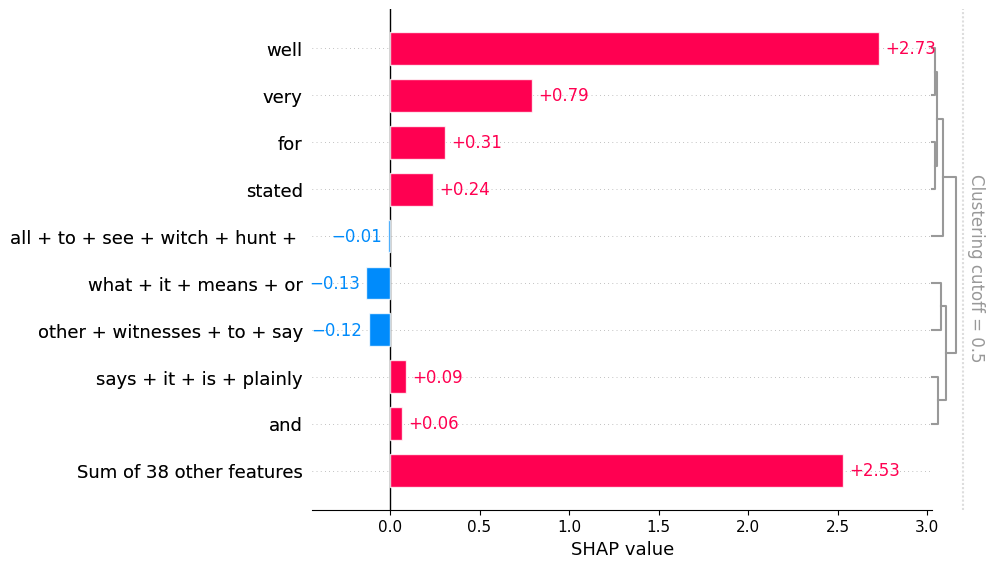

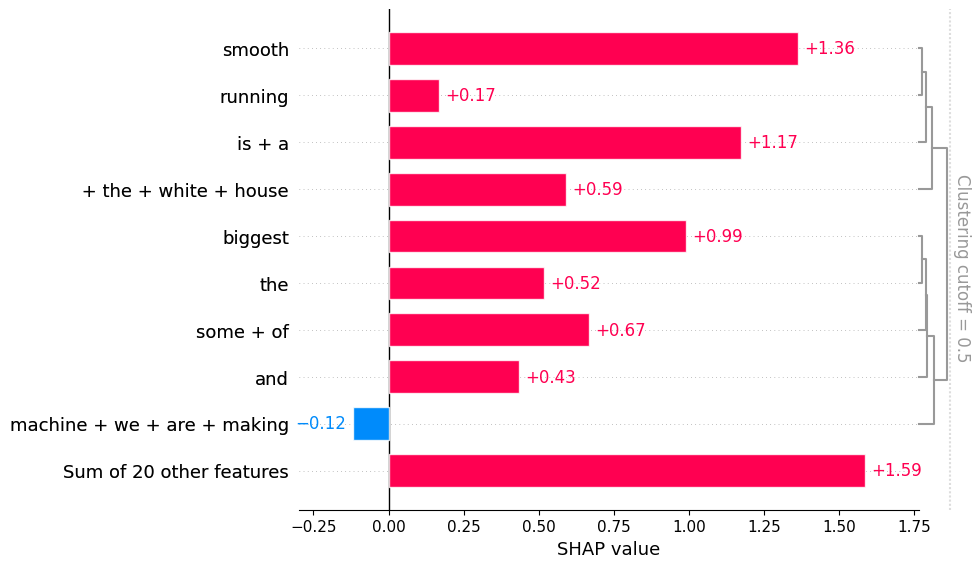

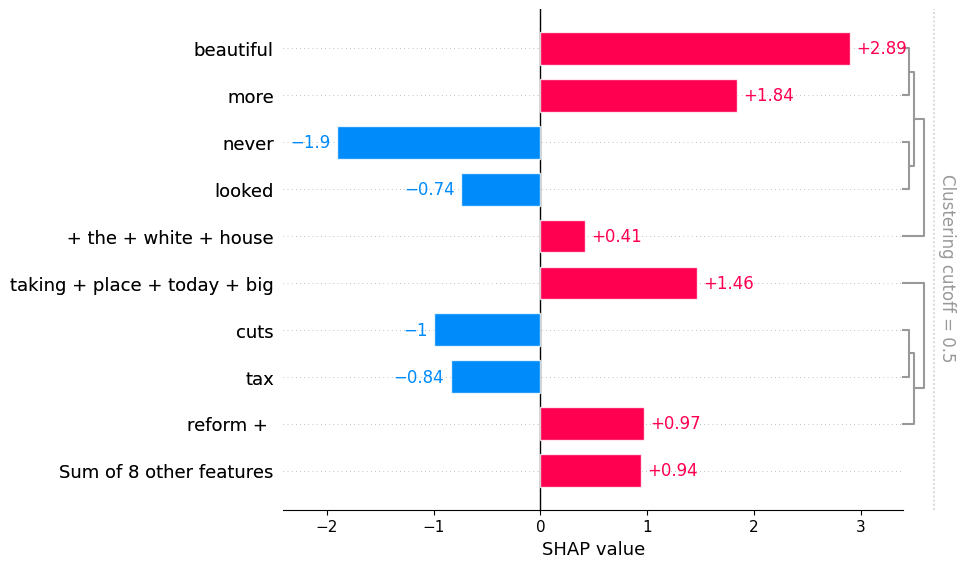

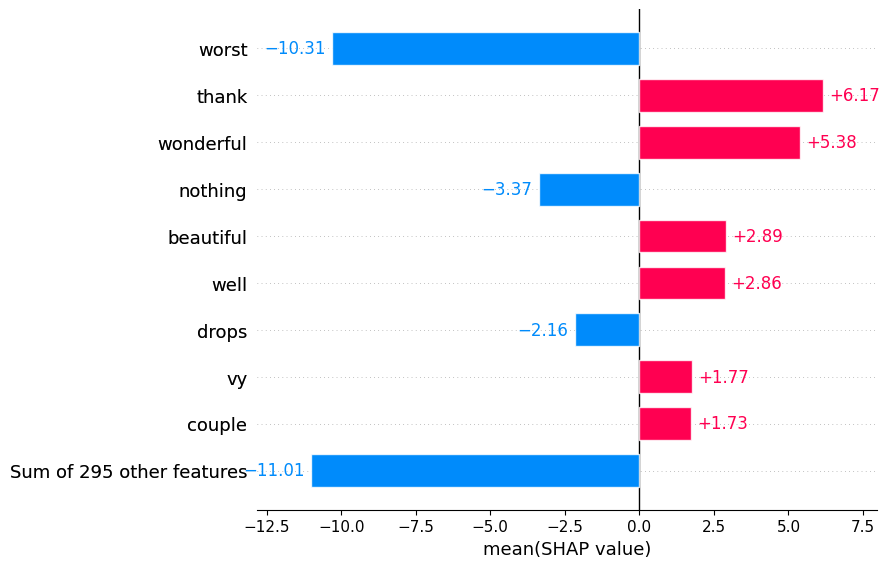

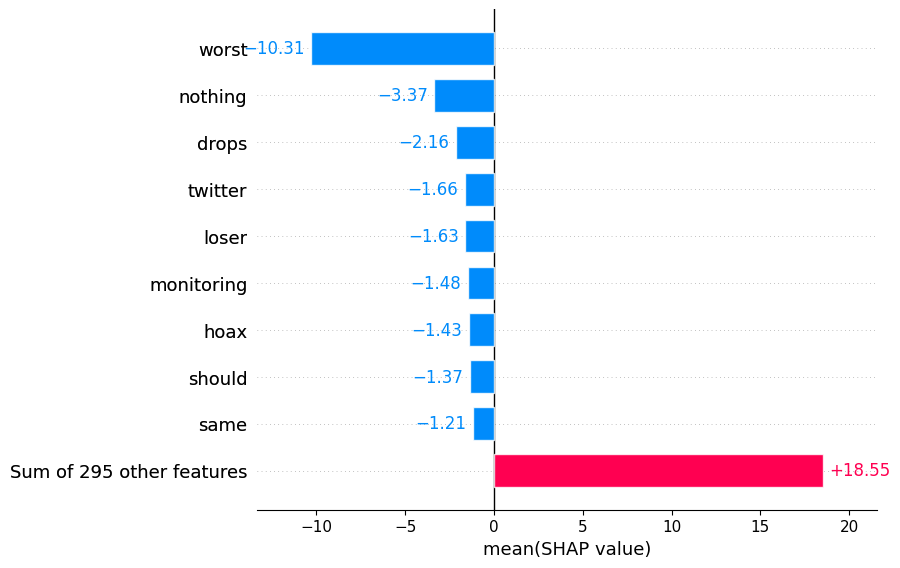

In [ ]:
for i in range(n):
    shap.plots.bar(shap_values[i, :,"POSITIVE"])
shap.plots.bar(shap_values[:, :, "POSITIVE"].mean(0))
shap.plots.bar(shap_values[:, :, "POSITIVE"].mean(0), order=shap.Explanation.argsort)

In [ ]:
average_after = sum(shap_values[:, :, "POSITIVE"].mean(0).values)/len(shap_values[:, :, "POSITIVE"].mean(0).values)

print(average_before)
print(average_after)

0.0434214058045168
-0.019895515927842083


In [ ]:
negative, positive = np.zeros((tweets.shape[0], 1)), np.zeros((tweets.shape[0], 1))

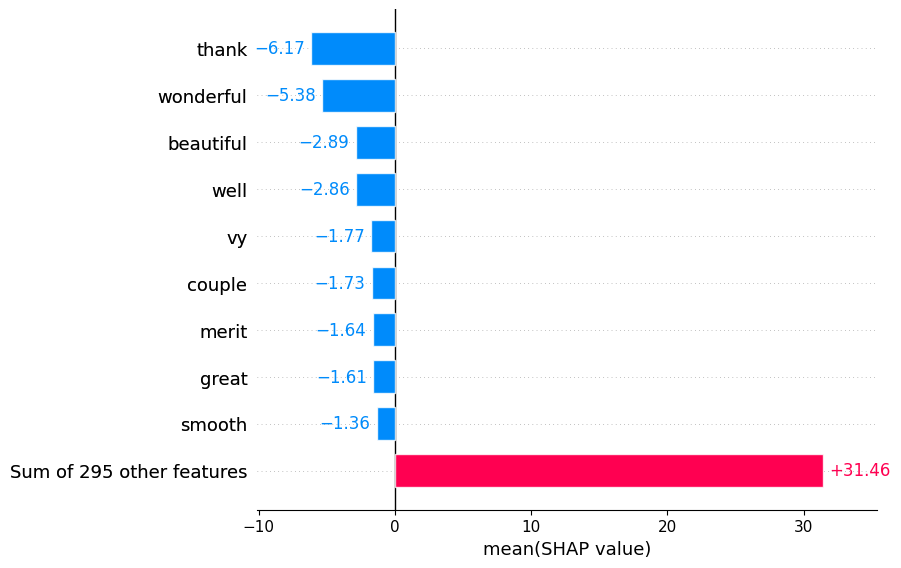

In [ ]:
shap.plots.bar(shap_values[:, :, "NEGATIVE"].mean(0), order=shap.Explanation.argsort)